<a href="https://colab.research.google.com/github/yuuiwqy622/xray-classification-tuberculosis/blob/main/xray_classification_dcgan_checkpoint.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Based on 

# Mount Onedrive

In [1]:
!wget https://downloads.rclone.org/v1.54.1/rclone-v1.54.1-linux-amd64.deb
!apt install ./rclone-v1.54.1-linux-amd64.deb
!rm rclone-v1.54.1-linux-amd64.deb

--2021-04-05 09:41:41--  https://downloads.rclone.org/v1.54.1/rclone-v1.54.1-linux-amd64.deb
Resolving downloads.rclone.org (downloads.rclone.org)... 5.153.250.7, 2a02:24e0:8:61f9::1
Connecting to downloads.rclone.org (downloads.rclone.org)|5.153.250.7|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14314950 (14M) [application/x-debian-package]
Saving to: ‘rclone-v1.54.1-linux-amd64.deb’

rclone-v1.54.1-linu 100%[===================>]  13.65M  15.7MB/s    in 0.9s    

2021-04-05 09:41:42 (15.7 MB/s) - ‘rclone-v1.54.1-linux-amd64.deb’ saved [14314950/14314950]

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Note, selecting 'rclone' instead of './rclone-v1.54.1-linux-amd64.deb'
The following NEW packages will be installed:
  rclone
0 upgraded, 1 newly installed, 0 to remove and 30 not upgraded.
Need to get 0 B/14.3 MB of archives.
After this operation, 45.0 MB of additional disk space will be used.
Get:1 /content/

In [3]:
!rclone config

2021/04/05 09:42:08 NOTICE: Config file "/root/.config/rclone/rclone.conf" not found - using defaults
No remotes found - make a new one
n) New remote
s) Set configuration password
q) Quit config
n/s/q> n
name> onedrive
Type of storage to configure.
Enter a string value. Press Enter for the default ("").
Choose a number from below, or type in your own value
 1 / 1Fichier
   \ "fichier"
 2 / Alias for an existing remote
   \ "alias"
 3 / Amazon Drive
   \ "amazon cloud drive"
 4 / Amazon S3 Compliant Storage Providers including AWS, Alibaba, Ceph, Digital Ocean, Dreamhost, IBM COS, Minio, and Tencent COS
   \ "s3"
 5 / Backblaze B2
   \ "b2"
 6 / Box
   \ "box"
 7 / Cache a remote
   \ "cache"
 8 / Citrix Sharefile
   \ "sharefile"
 9 / Compress a remote
   \ "compress"
10 / Dropbox
   \ "dropbox"
11 / Encrypt/Decrypt a remote
   \ "crypt"
12 / Enterprise File Fabric
   \ "filefabric"
13 / FTP Connection
   \ "ftp"
14 / Google Cloud Storage (this is not Google Drive)
   \ "google cloud s

In [4]:
!sudo mkdir /content/onedrive
!nohup rclone --vfs-cache-mode writes mount onedrive: /content/onedrive &
!rm nohup.out

nohup: appending output to 'nohup.out'


### Setup

In [5]:
import tensorflow as tf

In [6]:
tf.__version__

'2.4.1'

In [7]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-2arla10u
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-2arla10u
     |████████████████████████████████| 1.0MB 16.5MB/s 
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.074f7b69f3e7b659bd82146c3db8c68c69a2705c0_-cp37-none-any.whl size=147396 sha256=2c820609e8527f0161c875b90959b20a10444bcb46ae343b6c2277033ddec2cf
  Stored in directory: /tmp/pip-ephem-wheel-cache-bhv1qvrp/wheels/eb/1b/35/fce87697be00d2fc63e0b4b395b0d9c7e391a10e98d9a0d97f
Successfully built tensorflow-docs
  Found existing installation: protobuf 3.12.4
    Uninstalling protobuf-3.12.4:
      Successfully uninstalled protobuf-3.12.4


In [8]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display

### Load and prepare the dataset

You will use the MNIST dataset to train the generator and the discriminator. The generator will generate handwritten digits resembling the MNIST data.

In [9]:
from keras.preprocessing.image import load_img, img_to_array

In [10]:
from PIL import Image, ImageOps

def get_data(data_dir) :
    data_path = os.listdir(data_dir)
    X = []
    for filename in data_path :
        img = load_img(data_dir + "/" + filename, target_size = (64, 64))
        img = ImageOps.grayscale(img)
        img = img_to_array(img)
        X.append(img)
    return np.array(X)

In [134]:
# train_dir_abnormal = 'onedrive/xray-classification-tuberculosis/xrays-x64/train/1'
# train_images_abnormal = get_data(train_dir_abnormal)

In [11]:
train_dir_healthy = 'onedrive/xray-classification-tuberculosis/xrays-x64/train/0'
train_images = get_data(train_dir_healthy)

In [136]:
# train_labels_healthy = np.zeros(len(train_images_healthy))
# train_labels_abnormal = np.ones(len(train_images_abnormal))

In [137]:
# train_images = np.concatenate((train_images_healthy, train_images_abnormal), axis=0)
# train_labels = np.concatenate((train_labels_healthy, train_labels_abnormal), axis=0)

In [12]:
train_images = train_images/ 255

(64, 64, 1)


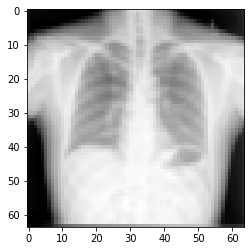

In [13]:
plt.imshow(train_images[300][:,:,0], cmap='gray')
print(train_images[300].shape)

In [14]:
BUFFER_SIZE = train_images.shape[0]
BATCH_SIZE = 32

In [15]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size of 28x28x1. Notice the `tf.keras.layers.LeakyReLU` activation for each layer, except the output layer which uses tanh.

Generator architecture is from https://keras.io/examples/generative/dcgan_overriding_train_step/

In [16]:
def make_generator_model():
    model = tf.keras.Sequential()

    model.add(layers.Dense(8*8*128, use_bias=False, input_shape=(128,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 128)))

    model.add(layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding='same', use_bias=False, activation='tanh'))

    return model

Use the (as yet untrained) generator to create an image.

(1, 64, 64, 1)


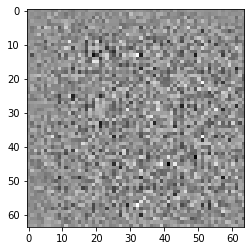

In [17]:
generator = make_generator_model()

noise = tf.random.normal([1, 128])
generated_image = generator(noise, training=False)
print(generated_image.shape)
plt.imshow(generated_image[0, :, :, 0], cmap='gray')

### The Discriminator

The discriminator is a CNN-based image classifier.

In [18]:
def make_discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Conv2D(64, kernel_size=5, strides=(2, 2), padding='same',
                                     input_shape=[64, 64, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, kernel_size=5, strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))


    return model

Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [19]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00219626]], shape=(1, 1), dtype=float32)


## Define the loss and optimizers

Define loss functions and optimizers for both models.


In [20]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [21]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [22]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since you will train two networks separately.

In [23]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [24]:
checkpoint_dir = 'onedrive/xray-classification-tuberculosis/dcgan-checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Define the training loop


In [25]:
EPOCHS = 50
noise_dim = 128
num_examples_to_generate = 4

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [26]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [30]:
def train(dataset, epochs, start_epoch=1):
  if start_epoch != 1:
    checkpoint_num = start_epoch // 10
    checkpoint.restore(f'onedrive/xray-classification-tuberculosis/dcgan-checkpoints/ckpt-{checkpoint_num}')
  for epoch in range(start_epoch, epochs+1):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch,
                             seed)

    # Save the model every 10 epochs
    if epoch % 10 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch, time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

**Generate and save images**


In [31]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)
  print(predictions.shape)

  fig = plt.figure(figsize=(10, 10))

  for i in range(predictions.shape[0]):
      plt.subplot(2, 2, i+1)
      plt.imshow(predictions[i, :, :, 0], cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

## Train the model
Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other (e.g., that they train at a similar rate).

At the beginning of the training, the generated images look like random noise. As training progresses, the generated digits will look increasingly real. After about 50 epochs, they resemble MNIST digits. This may take about one minute / epoch with the default settings on Colab.

(4, 64, 64, 1)


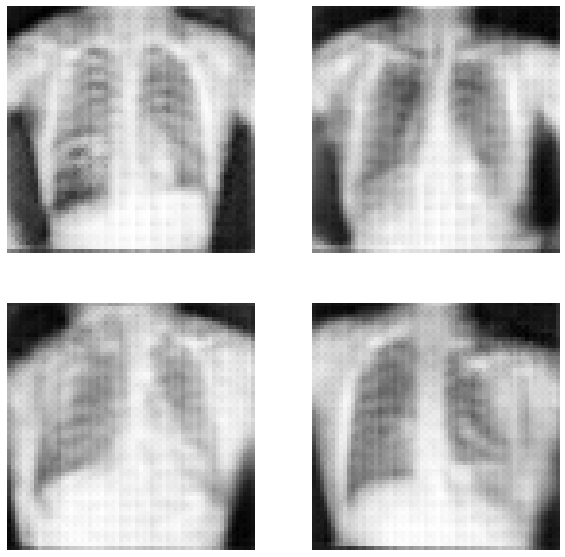

In [33]:
train(train_dataset, 2000, 1001)

Restore the latest checkpoint.

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Create a GIF


In [34]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

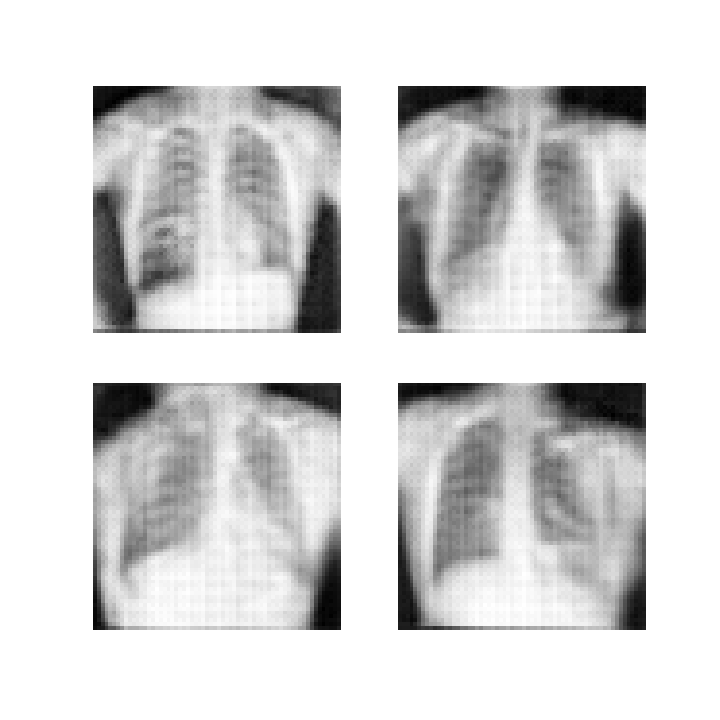

In [35]:
display_image(2000)

Use `imageio` to create an animated gif using the images saved during training.

In [61]:
import cv2

anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    image = cv2.resize(image, (512, 512), interpolation = cv2.INTER_AREA)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [54]:
import os
files = glob.glob('image*.png')
files = sorted(files, key=lambda f: f.split('_')[3])
for f in files[100:]:
  os.remove(f)


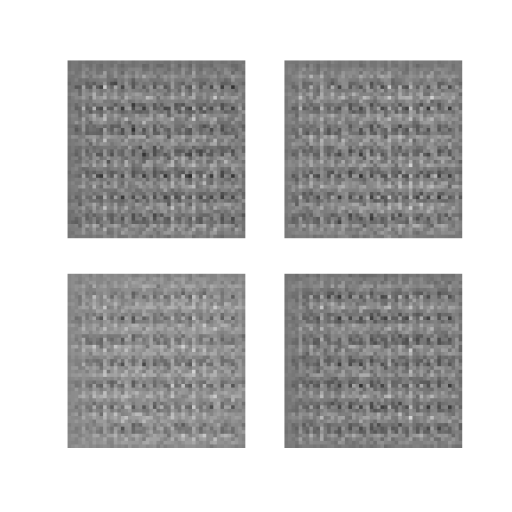

In [62]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)